<a href="https://colab.research.google.com/github/NaoyaToku109/pub/blob/main/robot_jacobi.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import math
import matplotlib.pyplot as plt
from matplotlib import animation, rc
import numpy as np
import pdb

#アーム長さです。これらは固定値になります。

l1 = 220
l2 = 220
l3 = 140


#どんどこパラメータを入れていきます。
#定数値です。
def _A(q1,q2,q3):
  A =  -(l1*math.sin(q1)) - (l2*math.sin(q1+q2)) - (l3*math.sin(q1+q2+q3))
  return A

def _B(q1,q2,q3):
  B = -(l2*math.sin(q1+q2)) - (l3*math.sin(q1+q2+q3))
  return B

def _C(q1,q2,q3):
  C = - (l3 * math.sin(q1+q2+q3))
  return C

def _D(q1,q2,q3):
  D = (l1 * math.cos(q1)) + (l2*math.cos(q1+q2)) + (l3 * math.cos(q1+q2+q3))
  return D

def _E(q1,q2,q3):
  E = (l2 * math.cos(q1+q2)) + (l3 * math.cos(q1+q2+q3))
  return E

def _F(q1,q2,q3):
  F = l3 * math.cos(q1+q2+q3)
  return F



#ヤコビアンです。
def _J(q1,q2,q3):
  J = np.matrix([[_A(q1,q2,q3),_B(q1,q2,q3),_C(q1,q2,q3)],[_D(q1,q2,q3),_E(q1,q2,q3),_F(q1,q2,q3)]])
  return J

#順運動学の方程式を作ります。θ→位置返します。
def _POS(l1,l2,l3,q1,q2,q3):
  x = (l1 * math.cos(q1)) + (l2*math.cos(q1+q2)) + (l3*math.cos(q1+q2+q3))
  y = (l1 * math.sin(q1)) + (l2*math.sin(q1+q2)) + (l3*math.sin(q1+q2+q3))
  p = np.matrix([[x],[y]])
  return p
#デバッグ用ダンプです。
def _dump(title ,loop,q1,q2,q3,x,y):
  s = title + "[" + str(loop) + "] - q[" + str(q1) + "," + str(q2) + "," + str(q3) + "]" + "p(" + str(x) +"," + str(y) + ")" 
  print(s)

_dump("d1" , 0 , 1,2,3 , 10,20)

#ヤコビアンの疑似逆行列
def _pinvJ(J):
  #一応行列式
 # np.linalg.det(J)
  #これが０になることを確認する（単純な逆行列がない)
  pinvJ = np.linalg.pinv(J)
  return pinvJ
#これは簡単すぎるので自力で計算したものも書いてみます。



d1[0] - q[1,2,3]p(10,20)


In [ ]:

fig = plt.figure(figsize=(8.0, 8.0))
plt.grid()

#x_ofs = 150

# 360度分のデータを作成
ims = []

#=====================================================================================================
# 初期位置を決めます。
#=====================================================================================================
#各現在のθ値です。
q1=-2.48
q2=-3.14
q3=-2.11

pos_ini = _POS(l1,l2,l3,q1,q2,q3)
print(q1)
print(q2)
print(q3)
print(pos_ini)

#先端の軌跡を描いてみようかと
kiseki_x = []
kiseki_y = []

#等速円運動角速度
w  = (180/math.pi)/1000 #角速度
r  = 300                  #半径
v = r*w

for t in range(200):
  #一定速度で移動するようにしてみます。
 #これは直線の。
  d_p = np.matrix([[1],[2]])
  if t > 100:
    d_p = np.matrix([[-1],[1]])
  if t > 150:
    d_p = np.matrix([[-1],[-3]])

#等速円運動をしてみる。
#  d_p = np.matrix([[v*math.cos(t/10)],[v*math.sin(t/10)]])

#  pdb.set_trace()

  #疑似逆行列ヤコビ。各関節のθを求めます。
  pinvJ = _pinvJ(_J(q1,q2,q3))
  d_q = pinvJ * d_p
#  print(d_q)
  #これが、今回のθ変位です。


  #これが今回のθ移動量です。
  q1 += d_q[0]
  q2 += d_q[1]
  q3 += d_q[2]

  #アームまでの距離
  pos   = _POS(l1,l2,l3,q1,q2,q3)
#  _dump("arm total",t,q1,q2,q3,pos[0],pos[1])
#  pdb.set_trace()

  #ここからアームの描画です。
  x=[]
  y=[]

  #ここで、各関節までの

  #θ1
  for _r in range(0,l1,2):
    x.append(_r*math.cos(q1))
    y.append(_r*math.sin(q1))
  #θ2
  lx = x[len(x)-1]
  ly = y[len(y)-1]
  for _r in range(0,l2,2):
    x.append( lx+_r*math.cos(q1+q2))
    y.append( ly+_r*math.sin(q1+q2))
  #θ3
  lx = x[len(x)-1]
  ly = y[len(y)-1]
  for _r in range(0,l3,2):
    x.append(lx+_r*math.cos( q1 + q2 + q3 ))
    y.append(ly+_r*math.sin( q1 + q2 + q3 ))

  #アーム３の先端の座標を残しておきます。
#  kiseki_x.appnend( lx + (l3 * math.cos( q1 + q2 + q3 )))
#  kiseki_x.appnend( ly + (l3 * math.sin( q1 + q2 + q3 )))
  kiseki_x.append( lx +(l3 * math.cos( q1 + q2 + q3 )))
  kiseki_y.append( ly +(l3 * math.sin( q1 + q2 + q3 )))
  
  plt.scatter(kiseki_x,kiseki_y,marker='.',c='gray')
  im = plt.scatter(x,y,marker='.',c='red')
  ims.append([im])

print(kiseki_x)

print('------')
print(kiseki_y)
# アニメーション作成
ani = animation.ArtistAnimation(fig, ims, interval=70, repeat_delay=10000)


rc('animation', html='jshtml')
plt.close()
ani


-2.48
-3.14
-2.11
[[ 10.98285952]
 [-89.12079343]]
[11.97664716243693, 12.968522875912507, 13.960397101279838, 14.952219409786895, 15.94393781143025, 16.935499109345134, 17.92684926636277, 18.917933777915223, 19.908698045579932, 20.89908774579756, 21.88904918863325, 22.87852966185917, 23.867477756085982, 24.855843667137755, 25.843579472334866, 26.830639377814485, 27.816979934466957, 28.802560220509307, 29.78734198914801, 30.771289780224215, 31.754370995174888, 32.73655593510275, 33.717817802224765, 34.69813266545526, 35.67747939138394, 36.65583954240849, 37.63319724427174, 38.6095390257241, 39.58485363345372, 40.55913182580784, 41.53236614914101, 42.50455070087134, 43.47568088350122, 44.44575315396774, 45.41476477273689, 46.382713557063184, 47.34959764281753, 48.31541525926442, 49.280164521170235, 50.24384324267743, 51.20644877750607, 52.167977890277456, 53.128426664115466, 54.08779045019438, 55.046063865567234, 56.00324084645548, 56.9593147651588, 57.914278619850606, 58.86812530766134

In [ ]:

fig = plt.figure(figsize=(12.0, 10.0))
plt.xlim(-200,200)
plt.ylim(-200,200)
plt.grid()

#x_ofs = 150

# 360度分のデータを作成
ims = []

q1=-2.48
q2=-3.14
q3=-2.11


#先端の軌跡を描いてみようかと
kiseki_x = []
kiseki_y = []

#等速円運動角速度
w  = (180/math.pi)/10000 #角速度
r  = 2000                 #半径
v = r*w
for t in range(200):
  #一定速度で移動するようにしてみます。
 #これは直線の。
#  d_p  = np.matrix([[1],[2]])
#等速円運動をしてみる。
  d_p = np.matrix([[v*math.cos(t/10)],[v*math.sin(t/10)]])


  #疑似逆行列ヤコビ。各関節のθを求めます。
  pinvJ = _pinvJ(_J(q1,q2,q3))
  d_q = pinvJ * d_p
  #これが今回のθ移動量です。
  q1 += d_q[0]
  q2 += d_q[1]
  q3 += d_q[2]

  #ここからアームの描画です。
  x=[]
  y=[]

  #θ1
  for _r in range(0,l1,2):
    x.append(_r*math.cos(q1))
    y.append(_r*math.sin(q1))
  #θ2
  lx = x[len(x)-1]
  ly = y[len(y)-1]
  for _r in range(0,l2,2):
    x.append(lx+_r*math.cos(q1+q2))
    y.append(ly+_r*math.sin(q1+q2))
  #θ3
  lx = x[len(x)-1]
  ly = y[len(y)-1]
  for _r in range(0,l3,2):
    x.append(lx+_r*math.cos( q1 + q2 + q3 ))
    y.append(ly+_r*math.sin( q1 + q2 + q3 ))

  #アーム３の先端の座標を残しておきます。
#  kiseki_x.appnend( lx + (l3 * math.cos( q1 + q2 + q3 )))
#  kiseki_x.appnend( ly + (l3 * math.sin( q1 + q2 + q3 )))

  kiseki_x.append( lx +(l3 * math.cos( q1 + q2 + q3 )))
  kiseki_y.append( ly +(l3 * math.sin( q1 + q2 + q3 )))

  plt.scatter(kiseki_x,kiseki_y,marker='.',c='gray')
  im = plt.scatter(x,y,marker='.',c='red')
#  im = plt.plot( kiseki_x[0] , kiseki_y[0] )
#  im =  plt.scatter(x,y,marker='.',c='red')
#  plt.show()
#  im = plt.plot(x,y)
  ims.append([im])
#  ims.append(im)

#  im = plt.scatter(kiseki_x,kiseki_y)
#  ims.append([im])
#  im = plt.scatter(r*math.cos(w*t), r*math.sin(w*t))
#  im = plt.scatter(x,y)

print(kiseki_x)
print('------')
print(kiseki_y)
# アニメーション作成
ani = animation.ArtistAnimation(fig, ims, interval=70, repeat_delay=10000)


rc('animation', html='jshtml')
plt.close()
ani


[22.403751600741895, 33.6987429716404, 44.75864762887553, 55.47438935594984, 65.74012811295367, 75.45437357855862, 84.5210387490755, 92.85042654262907, 100.36014211439704, 106.97592387535413, 112.63238684787872, 117.27367283390195, 120.85400277803149, 123.3381275673186, 124.70167425222458, 124.93138529049321, 124.02524896033759, 121.9925196594848, 118.8536275080844, 114.63997757789397, 109.39364018545922, 103.16693495400389, 96.02191266406984, 88.02974016607386, 79.2699947350563, 69.82987516963887, 59.80333767739789, 49.29016517992534, 38.39497915496706, 27.226203546684633, 15.894990640642465, 4.514119124035567, -6.803125172749944, -17.94407514505388, -28.797804055658474, -39.256232084458865, -49.215207014943886, -58.57554851813889, -67.24404588186836, -75.13439959660604, -82.16809797925143, -88.27522104443018, -93.39516521348024, -97.47728436375334, -100.48144551990525, -102.37850190176587, -103.15069363087784, -102.79200069838672, -101.30850237592657, -98.71886447679697, -95.05524427

In [ ]:
old =3
if old < 20:
    print("20歳未満の方はご利用できません。")
    print("またのご利用をお待ちしています。")
else:
    print("ご利用ありがとうございます。開始ボタンを押してください。")

20歳未満の方はご利用できません。
またのご利用をお待ちしています。


[2] ヤコビアンが上記の場合θの姿勢が入っていないので、追加して3×3の行列とする。


In [ ]:
import math
import matplotlib.pyplot as plt
from matplotlib import animation, rc
import numpy as np
import pdb

#アーム長さです。これらは固定値になります。

l1 = 220
l2 = 220
l3 = 140


#どんどこパラメータを入れていきます。
#定数値です。
def _A(q1,q2,q3):
  A =  -(l1*math.sin(q1)) - (l2*math.sin(q1+q2)) - (l3*math.sin(q1+q2+q3))
  return A

def _B(q1,q2,q3):
  B = -(l2*math.sin(q1+q2)) - (l3*math.sin(q1+q2+q3))
  return B

def _C(q1,q2,q3):
  C = - (l3 * math.sin(q1+q2+q3))
  return C

def _D(q1,q2,q3):
  D = (l1 * math.cos(q1)) + (l2*math.cos(q1+q2)) + (l3 * math.cos(q1+q2+q3))
  return D

def _E(q1,q2,q3):
  E = (l2 * math.cos(q1+q2)) + (l3 * math.cos(q1+q2+q3))
  return E

def _F(q1,q2,q3):
  F = l3 * math.cos(q1+q2+q3)
  return F


#ヤコビアンです。
#これを変更して、θ = q1 + q2 + q3 として偏微分したものを要素にいれます。
def _J(q1,q2,q3):
  J = np.matrix([[_A(q1,q2,q3),_B(q1,q2,q3),_C(q1,q2,q3)],[_D(q1,q2,q3),_E(q1,q2,q3),_F(q1,q2,q3)],[1,1,1]])
  return J

#順運動学の方程式を作ります。θ→位置返します。
def _POS(l1,l2,l3,q1,q2,q3):
  x = (l1 * math.cos(q1)) + (l2*math.cos(q1+q2)) + (l3*math.cos(q1+q2+q3))
  y = (l1 * math.sin(q1)) + (l2*math.sin(q1+q2)) + (l3*math.sin(q1+q2+q3))
  p = np.matrix([[x],[y]])
  return p

#デバッグ用ダンプです。
def _dump(title ,loop,q1,q2,q3,x,y):
  s = title + "[" + str(loop) + "] - q[" + str(q1) + "," + str(q2) + "," + str(q3) + "]" + "p(" + str(x) +"," + str(y) + ")" 
  print(s)

_dump("d1" , 0 , 1,2,3 , 10,20)

#ヤコビアンの疑似逆行列
def _pinvJ(J):
  pinvJ = np.linalg.pinv(J)
  return pinvJ
#これは簡単すぎるので自力で計算したものも書いてみます。
def _invJ(J):
  invJ = np.linalg.inv(J)
  return invJ


d1[0] - q[1,2,3]p(10,20)


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


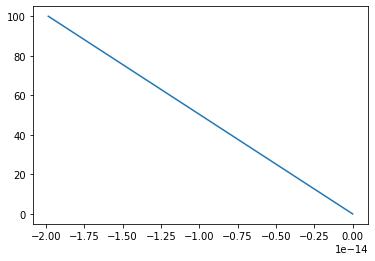

[-219.08902300206645, -19.999999999999908]
[-2.842170943040401e-14, -39.999999999999986]
[-1.9849181836372534e-14, 100.00000000000001]


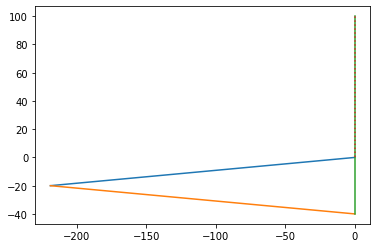

In [ ]:

q1 = math.radians(-174.7840914295459)
q2 = math.radians(169.56818285909176)
q3 = math.radians(95.21590857045415) #目的の確度です

p = _POS(l1,l2,l3,q1,q2,q3)
plt.plot( [0,p[0]] ,[0,p[1]] )
plt.show()

arm1 = [ l1 * math.cos(q1) , l1 * math.sin(q1) ]
print(arm1)

arm2 = [ arm1[0] + (l2 * math.cos(q1+q2)) , arm1[1] + (l2 * math.sin(q1+q2)) ]
print(arm2)

arm3 = [ arm2[0] + (l3 * math.cos(q1+q2+q3)) , arm2[1] + (l3 * math.sin(q1+q2+q3)) ]
print(arm3)


plt.plot( [0        , arm1[0]] , [ 0        ,  arm1[1]] )
plt.plot( [arm1[0] ,  arm2[0]] , [ arm1[1]  ,  arm2[1]] )
plt.plot( [arm2[0] ,  arm3[0]] , [ arm2[1]  ,  arm3[1]] )
plt.plot( [0,p[0]] ,[0,p[1]] , linestyle='dotted')
plt.show()

#) + (l2*math.sin(q1+q2)) + (l3*math.sin(q1+q2+q3))
#(l2*math.cos(q1+q2)) + (l3*math.cos(q1+q2+q3))
#  y = (l1 * math.sin(q1)) + (l2*math.sin(q1+q2)) + (l3*math.sin(q1+q2+q3))


#  x = (l1 * math.cos(q1)) + (l2*math.cos(q1+q2)) + (l3*math.cos(q1+q2+q3))
#  y = (l1 * math.sin(q1)) + (l2*math.sin(q1+q2)) + (l3*math.sin(q1+q2+q3))
#  p = np.matrix([[x],[y]])



In [ ]:
fig = plt.figure(figsize=(8.0, 8.0))
plt.grid()
plt.xlim(-300,100)
#plt.ylim(-300,200)


#x_ofs = 150

# 360度分のデータを作成
ims = []

#=====================================================================================================
# 初期位置を決めます。
#=====================================================================================================
#各現在のθ値です。
#q1= math.radians(90)  #90
#q2= math.radians(0)   #0
#q3= math.radians(0)   #0
#-142.09353319244417
#-179.9087476710785
#-120.8940947726037



#等速円運動用パラメータ
#等速円運動角速度
#周期Tは、60で一周するとする
T=100

w  = 2*math.pi/T      #角速度
r  = 90              #半径
v = r*w

#周期でちょうど一周するにはチックごとの

q1 = math.radians(217.30359596224162)
q2 = math.radians(-155.80978121449212)
q3 = math.radians(28.506185252250518) #目的の確度です

pos_ini = _POS(l1,l2,l3,q1,q2,q3)
print(math.degrees(q1))
print(math.degrees(q2))
print(math.degrees(q3))
print(pos_ini)

#先端の軌跡を描いてみようかと
kiseki_x = []
kiseki_y = []

for t in range(200):
  if t == 0:
    d_p=np.matrix([[0],[0],[0]])
  else:
    d_p = np.matrix([[v*math.cos(w*t)],[-v*math.sin(w*t)],[-w]])
    if t > 100:
      d_p = np.matrix([[0],[2],[0]])
    if t > 130:
      d_p = np.matrix([[1],[0],[0]])
    if t >  150:
      d_p = np.matrix([[-1],[0],[0]])
    if t > 170:
      d_p = np.matrix([[0],[-2],[0]])



  #疑似逆行列ヤコビ。各関節のθを求めます。
#  pinvJ = _pinvJ(_J(q1,q2,q3))
#  d_q = pinvJ * d_p
  invJ = _invJ(_J(q1,q2,q3))
  d_q = invJ * d_p
#  print(d_q)
  #これが、今回のθ変位です。


  #これが今回のθ移動量です。
  q1 += d_q[0]
  q2 += d_q[1]
  q3 += d_q[2]

  #アームまでの距離
  pos   = _POS(l1,l2,l3,q1,q2,q3)
#  _dump("arm total",t,q1,q2,q3,pos[0],pos[1])
#  pdb.set_trace()

  #ここからアームの描画です。
  x=[]
  y=[]

  #ここで、各関節までの

  #θ1
  for _r in range(0,l1,2):
    x.append(_r*math.cos(q1))
    y.append(_r*math.sin(q1))
  #θ2
  lx = x[len(x)-1]
  ly = y[len(y)-1]
  for _r in range(0,l2,2):
    x.append( lx+_r*math.cos(q1+q2))
    y.append( ly+_r*math.sin(q1+q2))
  #θ3
  lx = x[len(x)-1]
  ly = y[len(y)-1]
  for _r in range(0,l3,2):
    x.append(lx+_r*math.cos( q1 + q2 + q3 ))
    y.append(ly+_r*math.sin( q1 + q2 + q3 ))

  #アーム３の先端の座標を残しておきます。
#  kiseki_x.appnend( lx + (l3 * math.cos( q1 + q2 + q3 )))
#  kiseki_x.appnend( ly + (l3 * math.sin( q1 + q2 + q3 )))
  kiseki_x.append( lx +(l3 * math.cos( q1 + q2 + q3 )))
  kiseki_y.append( ly +(l3 * math.sin( q1 + q2 + q3 )))
  
  plt.scatter(kiseki_x,kiseki_y,marker='.',c='gray',alpha=0.5)
  im = plt.scatter(x,y,marker='.',c='red')
  ims.append([im])

print(kiseki_x)

print('------')
print(kiseki_y)
# アニメーション作成
ani = animation.ArtistAnimation(fig, ims, interval=70, repeat_delay=10000)


rc('animation', html='jshtml')
plt.close()
ani

217.30359596224162
-155.80978121449212
28.506185252250518
[[-70.]
 [200.]]
[-69.36363636363626, -63.70860340080834, -58.10580090852397, -52.5764607630683, -47.1416494939116, -41.82218513449654, -36.638547190116604, -31.61078375126553, -26.7584187588932, -22.10036147089467, -17.6548194216998, -13.439215633419508, -9.47011049617926, -5.763128537342965, -2.3328901966696236, 0.8070513204864938, 3.6442680533234153, 6.167510099365032, 8.366753166323761, 10.233240791301782, 11.759521154460273, 12.939478416105146, 13.768358511899578, 14.242789350216896, 14.360795367940085, 14.121806415738462, 13.52666096048766, 12.577603610594664, 11.27827698916343, 9.633707999861258, 7.650288550755292, 5.335750822037852, 2.6991371842600387, -0.249235105744134, -3.4978142837852744, -7.033859364803291, -10.843490150337757, -14.911741751826554, -19.222623406781935, -23.759181347996147, -28.503565470021613, -33.43709952233131, -38.54035454487067, -43.793225249223696, -49.17500903738757, -54.664487340226074, -60.2